# Business Case 2

Group members:
- Lorenzo Pigozzi	--- m20200745
- Nguyen Huy Phuc	--- m20200566
- Ema Mandura	  --- m20200647


## Hotel Chain C

**Overview**\
The objective of the project is to provide an algorithm able to predict if a customer will cancell his booking. 
For further informations about the business context or dataset provided, check the context folder available on GitHub.

<a class="anchor" id="0.1"></a>
# **Table of Contents**

1.	[Importing data and libraries](#1)   
2.	[Exploratory data analysis (EDA)](#2)       
3.	[Data preprocessing](#3)  
4.  [Modeling](#4)      
5.  [Assessments](#5)
6.  [Profiling of the result](#6)

# 1. Importing data and libraries <a class="anchor" id="1"></a>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
import phik

# sklearn
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.base import BaseEstimator

# supervised algorithms
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_graphviz
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression

#encoders
import category_encoders as ce
from category_encoders import TargetEncoder
import category_encoders.utils as util

# visualizations
import plotly.graph_objects as go
import graphviz

In [2]:
df = pd.read_csv('data/H2.csv')

# 2. Exploratory data analysis (EDA) <a class="anchor" id="2"></a>

In [3]:
def countplot_all(df, columns):
    #Prepare figure layout
    rows = int(math.ceil(columns.shape[0]/5))
    sns.set_style("whitegrid")
    fig, axes = plt.subplots(nrows = rows, ncols=5, figsize=(15,3*rows))

    # Draw the boxplots
    for i in zip(axes.flatten(), columns):
        sns.countplot(x=df.loc[:,i[1]], ax=i[0])      
        i[0].set_title(i[1])
        i[0].set_ylabel("")
        i[0].set_xlabel("")
        for tick in i[0].get_xticklabels():
            tick.set_rotation(-25)
    # Finalize the plot
    plt.subplots_adjust(wspace=0.5,hspace = 0.5)
    fig.suptitle("Count plots", fontsize=25)
    #sns.despine(bottom=True)
    plt.show()


def corrheatmap(dataframe, method = "pearson"):
    sns.set(style="white")
    # Compute the correlation matrix
    if method == "phik":
        corr = dataframe.phik_matrix()
    else:
        corr = dataframe.corr(method= method)

    # Generate a mask for the upper triangle
    mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
    mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values
    
    # Set up the matplotlib figure
    fig, ax = plt.subplots(figsize=(20, 16))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True,annot=True, linewidths=.5,vmin = -1, vmax = 1, ax=ax)

    # Layout
    plt.subplots_adjust(top=0.95)
    plt.suptitle("Correlation matrix", fontsize=15)
    plt.yticks(rotation=0, fontsize = 14)
    plt.xticks(rotation=-45, fontsize = 14)
    # Fixing the bug of partially cut-off bottom and top cells
    b, t = plt.ylim() # discover the values for bottom and top
    b += 0.5 # Add 0.5 to the bottom
    t -= 0.5 # Subtract 0.5 from the top
    plt.ylim(b, t) # update the ylim(bottom, top) values

    plt.show()        

    
def boxplot_withoutLabels(df):
    plot_features = df.columns
    #Prepare figure layout
    rows = int(math.ceil(df.shape[1]/8))
    sns.set(style="whitegrid")
    fig, axes = plt.subplots(nrows = rows, ncols=8, figsize=(16,4*rows))

    # Draw the boxplots
    for i in zip(axes.flatten(), plot_features):
        sns.boxplot(y=df.loc[:,i[1]], ax=i[0])      
        i[0].set_title(i[1])
        i[0].set_ylabel("")
        for tick in i[0].get_xticklabels():
            tick.set_rotation(-25)

    # Finalize the plot
    plt.subplots_adjust(wspace=2,hspace = 0.5)
    fig.suptitle("Box plots", fontsize=25)
    #sns.despine(bottom=True)
    plt.show()

In [4]:
df.iloc[:,25:]

,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,Transient,0.00,0,0,Check-Out,2015-07-03
1,Transient,76.50,0,1,Canceled,2015-07-01
2,Transient,68.00,0,1,Canceled,2015-04-30
3,Transient,76.50,0,2,Canceled,2015-06-23
4,Transient,76.50,0,1,Canceled,2015-04-02
...,...,...,...,...,...,...
79325,Transient,96.14,0,0,Check-Out,2017-09-06
79326,Transient,225.43,0,2,Check-Out,2017-09-07
79327,Transient,157.71,0,4,Check-Out,2017-09-07
79328,Transient,104.40,0,0,Check-Out,2017-09-07


In [5]:
print('Number of observation in the dataset: ', df.shape[0])
print('Number of observation in the dataset: ', df.shape[1])

Number of observation in the dataset:  79330
Number of observation in the dataset:  31


In [6]:
# defining metric, non_metric and categorical features

metric_feats = ['LeadTime', 'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'PreviousCancellations','PreviousBookingsNotCanceled',
       'BookingChanges','DaysInWaitingList', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests', 'IsRepeatedGuest']

non_metric_feats = df.columns[~df.columns.isin(metric_feats)]

cat_feats = ['ArrivalDateYear', 'ArrivalDateMonth', 'Meal',
       'MarketSegment', 'DistributionChannel',
       'ReservedRoomType', 'CustomerType', 'ReservationStatus']

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79330 entries, 0 to 79329
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   IsCanceled                   79330 non-null  int64  
 1   LeadTime                     79330 non-null  int64  
 2   ArrivalDateYear              79330 non-null  int64  
 3   ArrivalDateMonth             79330 non-null  object 
 4   ArrivalDateWeekNumber        79330 non-null  int64  
 5   ArrivalDateDayOfMonth        79330 non-null  int64  
 6   StaysInWeekendNights         79330 non-null  int64  
 7   StaysInWeekNights            79330 non-null  int64  
 8   Adults                       79330 non-null  int64  
 9   Children                     79326 non-null  float64
 10  Babies                       79330 non-null  int64  
 11  Meal                         79330 non-null  object 
 12  Country                      79306 non-null  object 
 13  MarketSegment   

In [8]:
# missing values check
df.isna().sum()

IsCanceled                      0
LeadTime                        0
ArrivalDateYear                 0
ArrivalDateMonth                0
ArrivalDateWeekNumber           0
ArrivalDateDayOfMonth           0
StaysInWeekendNights            0
StaysInWeekNights               0
Adults                          0
Children                        4
Babies                          0
Meal                            0
Country                        24
MarketSegment                   0
DistributionChannel             0
IsRepeatedGuest                 0
PreviousCancellations           0
PreviousBookingsNotCanceled     0
ReservedRoomType                0
AssignedRoomType                0
BookingChanges                  0
DepositType                     0
Agent                           0
Company                         0
DaysInWaitingList               0
CustomerType                    0
ADR                             0
RequiredCarParkingSpaces        0
TotalOfSpecialRequests          0
ReservationSta

In [9]:
# Checking duplicated observations
df.loc[df.duplicated(keep=False), :]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
8,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
9,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
10,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
12,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
17,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79292,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79293,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79294,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79312,0,175,2017,August,35,31,1,3,1,0.0,...,No Deposit,42,NULL,0,Transient,82.35,0,1,Check-Out,2017-09-04


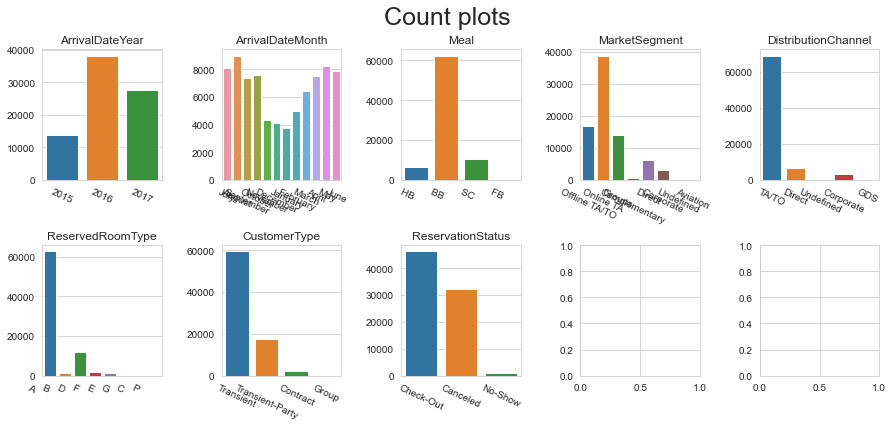

In [10]:
# checking the distribution of the categorical features
countplot_all(df,np.array(cat_feats))

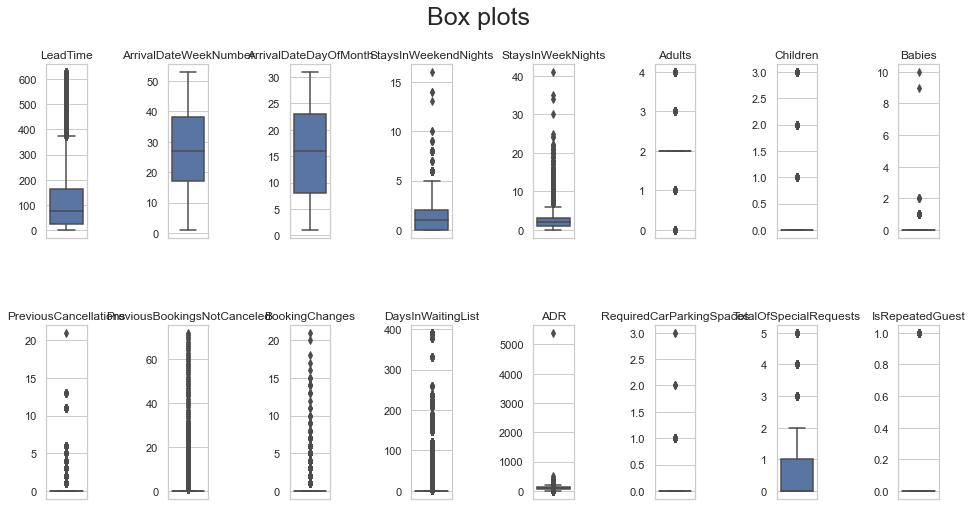

In [11]:
# checking the distributions of the metric features
boxplot_withoutLabels(df[metric_feats])

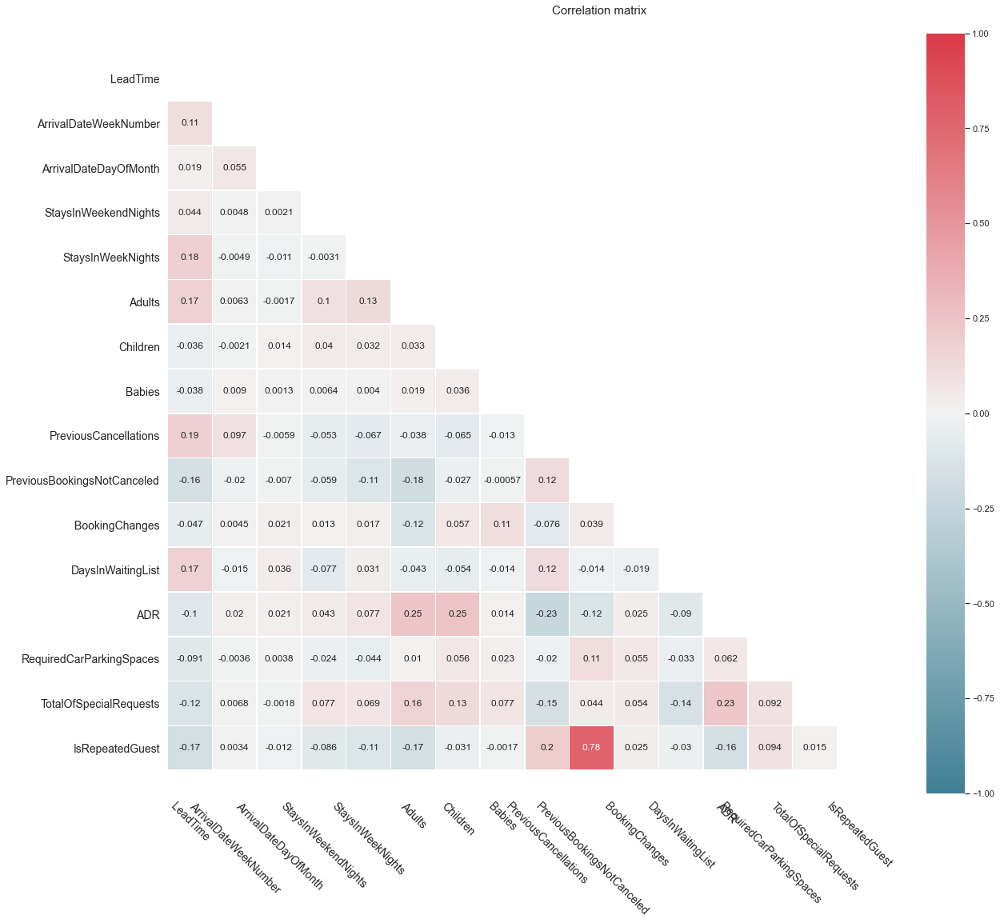

In [12]:
# checking the correlations among the numerical features
corrheatmap(df[metric_feats], method = 'spearman')

In [13]:
#checking no sense values
df[(df['Adults'] == 0) & (df['Children'] == 0)]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
332,0,132,2015,July,30,23,2,5,0,0.0,...,No Deposit,1,NULL,0,Transient-Party,0.00,0,0,Check-Out,2015-07-30
862,0,0,2015,August,33,9,2,0,0,0.0,...,No Deposit,9,NULL,0,Contract,0.00,0,0,Check-Out,2015-08-11
960,0,0,2015,August,33,10,9,20,0,0.0,...,No Deposit,NULL,47,0,Transient,0.00,0,0,Check-Out,2015-09-08
996,0,0,2015,August,33,11,0,4,0,0.0,...,No Deposit,NULL,49,0,Transient-Party,0.00,0,1,Check-Out,2015-08-15
2392,1,1,2015,September,37,6,2,0,0,0.0,...,No Deposit,1,NULL,0,Transient-Party,0.00,0,0,Canceled,2015-09-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74969,0,107,2017,June,26,27,0,3,0,0.0,...,No Deposit,7,NULL,0,Transient,100.80,0,0,Check-Out,2017-06-30
75031,0,1,2017,June,26,30,0,1,0,0.0,...,No Deposit,NULL,NULL,0,Transient,0.00,1,1,Check-Out,2017-07-01
76191,0,44,2017,July,28,15,1,1,0,0.0,...,No Deposit,425,NULL,0,Transient,73.80,0,0,Check-Out,2017-07-17
76474,0,2,2017,July,28,15,2,5,0,0.0,...,No Deposit,9,NULL,0,Transient-Party,22.86,0,1,Check-Out,2017-07-22


**Notes:**
- Iscancelled is the target variable
- ReservationStatus : be careful, possible alternative target variable
- there are only a few NaNs in the variables Children and Country
- there are many duplicated rows in the data. Nevertheless, it was specified by the company that it's a coincidence, they're not duplicated customers
- arrivaldatemonth is not useful due to the ArrivalDateWeekNumber
- no relevant correlations detected among the metric features
- data may contain outliers probably

**Ideas:**
- deployment : api providing the warning message and the percentage of the probability of cancellation
- final slide: take away messages ---> profiling the customers who cancel and provide this information at the end of the presentation


# 3. Data preprocessing <a class="anchor" id="3"></a>

### 3.1. Data Cleaning

In [14]:
df

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,6,2015,July,27,1,0,2,1,0.0,...,No Deposit,6,NULL,0,Transient,0.00,0,0,Check-Out,2015-07-03
1,1,88,2015,July,27,1,0,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.0,...,No Deposit,9,NULL,0,Transient,68.00,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-04-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,0,23,2017,August,35,30,2,5,2,0.0,...,No Deposit,394,NULL,0,Transient,96.14,0,0,Check-Out,2017-09-06
79326,0,102,2017,August,35,31,2,5,3,0.0,...,No Deposit,9,NULL,0,Transient,225.43,0,2,Check-Out,2017-09-07
79327,0,34,2017,August,35,31,2,5,2,0.0,...,No Deposit,9,NULL,0,Transient,157.71,0,4,Check-Out,2017-09-07
79328,0,109,2017,August,35,31,2,5,2,0.0,...,No Deposit,89,NULL,0,Transient,104.40,0,0,Check-Out,2017-09-07


In [15]:
# dropping rows based on no sense value check
df = df[~(df['Adults'] == 0) | ~(df['Children'] == 0)]

In [16]:
# dropping missing values for the variable Children (4 observations)
df = df[~df['Children'].isna()]
df = df[~df['Country'].isna()]

#### Notes
Dropping variables: 
- ArrivalDateDayOfMonth : not useful for the prediction
- ArrivalDateMonth : redundant with the variable ArrivalDateWeekNumber
- Country : it's possible to store this information only when the customer arrives
- ReservationStatusDate : other variables are more relevant and repeat info (ex. LeadTime)
- AssignedRoomType : it's possible to store this information only when the customer arrives
- Company : the majority of the customers has the same value ('NULL' --> more than 95 %)
- DepositType : this variable is incorrect
- Agent : not useful for the prediction
- ReservationStatus : it's possible to store this information only when the customer arrives
- MarketSegment : high correlation with DistributionChannel, and also meaning very similar
- ArrivalDateYear : it's not useful for a prediction, because the goal is to predict the next customers

In [17]:
# dropping variables
# variables not relevant for the prediction purpose
df.drop(columns=['ReservationStatus', 'ArrivalDateYear', 'AssignedRoomType', 'MarketSegment','ArrivalDateMonth', 'ReservationStatusDate', 'Company', 'Babies', 'DepositType'], inplace=True)

In [18]:
# updating the feature lists
metric_feats = ['LeadTime', 'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children', 'PreviousCancellations','PreviousBookingsNotCanceled',
       'BookingChanges','DaysInWaitingList', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests']

cat_feats = ['Meal', 'DistributionChannel', 'Agent', 'Country',
       'ReservedRoomType', 'CustomerType']

### 3.2. Features encoding

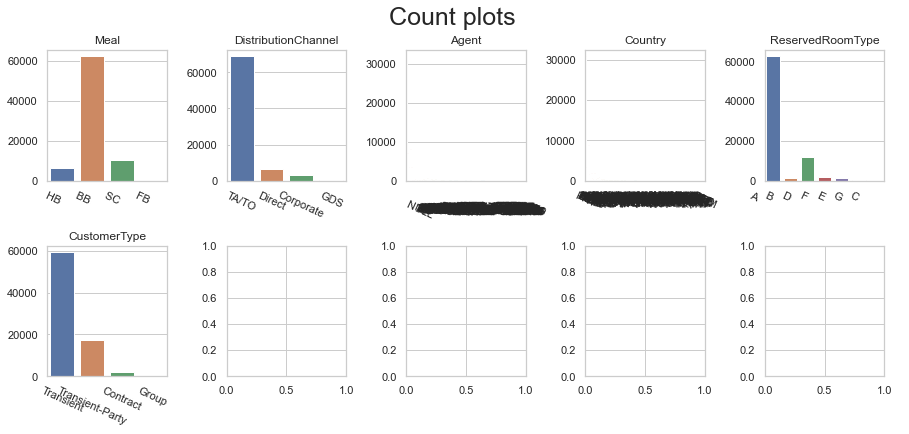

In [19]:
# checking the distribution of the categorical features
countplot_all(df,np.array(cat_feats))

In [20]:
## encoding manually some categorical variables in order to modify the distribution
# df['ReservedRoomType'] = df['ReservedRoomType'].replace(['F               ', 'E               ', 'B               ', 'C               ', 'G               '], 'Other')
# df['CustomerType'] = df['CustomerType'].replace(['Contract', 'Group'], 'Other')

In [21]:
# # One Hot Encoder 
# df_ohc = df.copy()

# ohc = OneHotEncoder(sparse=False)
# ohc_feat = ohc.fit_transform(df_ohc[cat_feats])
# ohc_feat_names = ohc.get_feature_names(cat_feats)
# ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)

# df_ohc1 = pd.concat([df_ohc.drop(columns=cat_feats), ohc_df], axis=1)

# # df = df_ohc1.copy()

In [22]:
# df = df_ohc1.copy()

### 3.3. Feature selection
Checking the correlation with the target variable

In [23]:
# binary_feats = ['ArrivalDateYear_2015', 'ArrivalDateYear_2016', 'ArrivalDateYear_2017',
#        'Meal_BB       ', 'Meal_FB       ', 'Meal_HB       ', 'Meal_SC       ', 
#        'DistributionChannel_Corporate',
#        'DistributionChannel_Direct', 'DistributionChannel_GDS',
#        'DistributionChannel_TA/TO', 'ReservedRoomType_A               ',
#        'ReservedRoomType_D               ', 'ReservedRoomType_Other',
#        'CustomerType_Other', 'CustomerType_Transient',
#        'CustomerType_Transient-Party', 'IsCanceled', 'IsRepeatedGuest']

In [24]:
# checking the correlations among the numerical features
# corrheatmap(df[binary_feats], method = 'phik')

In [25]:
# dropping variables based on correlation check
# the reason of these high correlation is due to the perfect collinearity among the same group of variables
# df.drop(columns=['Meal_BB       ', 'DistributionChannel_TA/TO', 'ReservedRoomType_A               ', 'CustomerType_Transient'], inplace=True)

### 3.4. Oultiers

In [26]:
# computing the DBSCAN for outliers

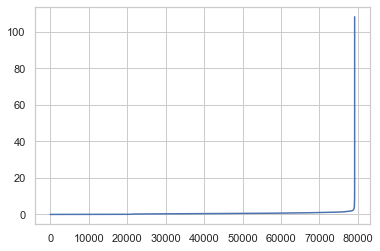

In [27]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=10)
data = pd.DataFrame(RobustScaler().fit_transform(df[metric_feats]), columns=df[metric_feats].columns, index = df.index)
neigh.fit(data)
distances, _ = neigh.kneighbors(data)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [28]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=4, min_samples=80, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df[metric_feats])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 36


C:\Users\lorep\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='count'>

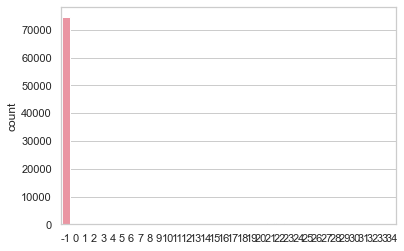

In [29]:
# Concatenating the labels to df
sns.countplot(dbscan_labels)

In [30]:
# the observations identified as outliers are the ones with labels = -1 
# dispaying the outliers detected
print('Number of outliers detected by DBSCAN :', np.sum(dbscan_labels == -1))

Number of outliers detected by DBSCAN : 74492


We tried to use the unsupervised DBSCAN algorithm to detect the outliers. Hower, the input space seems to be not the most adeguate for this kind of detection.

# 4. Modeling <a class="anchor" id="4"></a>

In [31]:
# splitting the dataset
X = df.drop(['IsCanceled'], axis=1)
Y = df['IsCanceled']

X_train, X_test, y_train, y_test = train_test_split( X, Y,
                                                    train_size = 0.90, 
                                                    shuffle = True, 
                                                    stratify = Y)

X, Y = X_train, y_train

X_train, X_validation, y_train, y_validation = train_test_split( X, Y,
                                                    train_size = 0.85, 
                                                    shuffle = True, 
                                                    stratify = Y)

In [32]:
## Encoding categorical features
# Initia the encoder model
GLMMEncoder = ce.glmm.GLMMEncoder(verbose =0 ,binomial_target=False)
# fit the train data
GLMMEncoder.fit(X_train[cat_feats],y_train)
# transform training set
X_train[cat_feats] = GLMMEncoder.transform(X_train[cat_feats])

X_validation[cat_feats] = GLMMEncoder.transform(X_validation[cat_feats])
# transform test set
X_test[cat_feats] = GLMMEncoder.transform(X_test[cat_feats])

C:\Users\lorep\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
C:\Users\lorep\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [33]:
# Standardization of the variables with the robust scaler
scaler = RobustScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns, index = X_train.index)
X_validation_scaled = pd.DataFrame(scaler.transform(X_validation), columns=X_validation.columns, index = X_validation.index)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns, index = X_test.index)

X_train, X_validation, X_test = X_train_scaled, X_validation_scaled, X_test_scaled

In [34]:
# X, y = X_train, y_train

def run_model(model,X,y):
    model = model.fit(X,y)
    return model

def evaluate_model(X,y, model):
    return model.score(X,y)

def avg_score(model, method,X,y):
    score_train = []
    score_test = []
    for train_index, test_index in method.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        model = run_model(model, X_train, y_train)
        value_train = evaluate_model(X_train, y_train, model)
        value_test = evaluate_model(X_test,y_test, model)
        score_train.append(value_train)
        score_test.append(value_test)

    print('Train:', np.mean(score_train))
    print('Test:', np.mean(score_test))

In [35]:
# random forest
random_forest = RandomForestClassifier()

random_forest.fit(X_train, y_train)
y_prediction = random_forest.predict(X_validation)  
Random_Forest_F1 = round(f1_score(y_true = y_validation, y_pred = y_prediction, average='micro')*100, 3)
Random_Forest_F1
# # Score
# kf = StratifiedKFold(n_splits=10)
# avg_score(random_forest, kf, X_train, y_train)

88.62

In [36]:
# decision tree
decision_tree = DecisionTreeClassifier() 
decision_tree.fit(X_train, y_train)  
y_prediction = decision_tree.predict(X_validation)  
DT_F1 = round(f1_score(y_true = y_validation, y_pred = y_prediction, average='micro')*100, 3)
DT_F1

84.726

In [37]:
# gradient boosting 
gb_model = GradientBoostingClassifier()

gb_model.fit(X_train, y_train)
y_prediction = gb_model.predict(X_validation)  
GradientBoosting_F1 = round(f1_score(y_true = y_validation, y_pred = y_prediction, average='micro')*100, 3)
GradientBoosting_F1
# Score
# kf = StratifiedKFold(n_splits=10)
# avg_score(gb_model, kf, X_train, y_train)

83.987

In [38]:
results = pd.DataFrame({'Model': ['Random Forest', 'Decision Tree', 'Gradient Boosting'],'Score': [Random_Forest_F1, DT_F1, GradientBoosting_F1]})
result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Score')
result_df.head(3)

,Model
Score,
88.620,Random Forest
84.726,Decision Tree
83.987,Gradient Boosting


### Tuning the parameters

In [39]:
def calculate_f1(interval, x_train, x_test, y_train, y_test, parameter):
    train_results = []
    test_results = []
    for value in interval:
        if parameter == 'Number of estimators':
            dt = GradientBoostingClassifier(ccp_alpha= 0,
                                    criterion= 'friedman_mse',
                                    learning_rate= 0.5,
                                    loss= 'deviance',
                                    min_samples_leaf= 5,
                                    min_samples_split= 2,
                                    n_estimators= value,
                                    random_state= 10)
        elif parameter == 'Learning Rate':
            dt = GradientBoostingClassifier(ccp_alpha= 0,
                                    criterion= 'friedman_mse',
                                    learning_rate= value,
                                    loss= 'deviance',
                                    min_samples_leaf= 5,
                                    min_samples_split= 2,
                                    n_estimators= 100,
                                    random_state= 10)
        dt.fit(x_train, y_train)
        train_results.append(f1_score(y_train,dt.predict(x_train), average='micro'))
        test_results.append(f1_score(y_test,dt.predict(x_test), average='micro'))
    value_train = train_results.index(max(train_results))
    value_test = test_results.index(max(test_results))
    print('The best train value is ',interval[value_train])
    print('The best test value is ',interval[value_test])

    fig = plt.figure(figsize = (16,10))
    line1, = plt.plot(interval, train_results, '#515C60', label="Train F1", linewidth=3)
    line2, = plt.plot(interval, test_results, '#C7DC1F', label="Test F1", linewidth=3)
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("F1 score")
    plt.xlabel(str(parameter))
    plt.show()

In [40]:
# num_estimators = list(range(50,250))
# calculate_f1(num_estimators, X_train, X_validation, y_train, y_validation,'Number of estimators')

# 5. Assessment <a class="anchor" id="5"></a>

In [41]:
# calculate the performance of the model on the test set
y_prediction = random_forest.predict(X_test)  

In [42]:
print(classification_report(y_test, y_prediction))

              precision    recall  f1-score   support

           0       0.88      0.92      0.90      4609
           1       0.88      0.83      0.86      3306

    accuracy                           0.88      7915
   macro avg       0.88      0.88      0.88      7915
weighted avg       0.88      0.88      0.88      7915



**Choice of the measure:**\
Considering the business context, the most damaging error is the False Negative, because a customer who will potentially cancel is a probem that really matters for the hotel in terms of revenue.
The marginal loss in terms of revenue due to a cancellation is worst than a gift offered to a customer who will not cancel.
Considering the business needs, thus, it's advisable to focus on the reduction of the false negatives, as much as possible. In order to take it into consideration, the best choice of measure is the Recall, that consider the True positive / false negatives, in particular focused on the prediction of class "IsCancel" = 1. Getting a high recall means reducing the false negatives error.

# 6. Profiling of the result <a class="anchor" id="6"></a>

In [43]:
x = df['LeadTime']
y = df['ArrivalDateWeekNumber']
color = df['IsCanceled']
size = 5 
z = df['ADR']

data_3d = dict(type='scatter3d',
            x=x, 
            y=y,  
            z=z,
            mode='markers',
            marker=dict(size=size,
                        color=color,
                        colorbar=dict(title=dict(text='Clusters')),
                        colorscale='Viridis',
                        showscale=False,
                        line=dict(width=2,
                                  color='black',
                                  colorscale='inferno' #Not in use here since our line color is fixed!
                                )
                       ),
            name='3D Scatter Visualization',
            showlegend=False
           )


layout_3d = dict(title=dict(text='Wonderful Wine of the World clusters'),
              scene=dict(yaxis=dict(title='ArrivalDateWeekNumber'),
                         xaxis=dict(title='LeadTime'),
                         zaxis=dict(title='ADR')
                        ),
              margin=dict(l=0, r=0, b=10, t=30)
                        
             )

fig_3 = go.Figure(data=data_3d, layout=layout_3d)

fig_3.show()

In [44]:
def meanplot_df(df, labels):
    df_concat = pd.concat((df, pd.Series(labels, name='labels',index = df.index)), axis=1)
    plot_data = df_concat.groupby('labels').mean()
    sns.set_style("whitegrid")
    # Plot PCA data
    fig, ax = plt.subplots(figsize = (24,12))
    ax = sns.lineplot(data = plot_data.T,dashes = False)
    plt.xticks(rotation=45)
    plt.show()  

def boxplot_withLabels(df, labels):
    # Concatenate the dataframe with the labels
    df_concat = pd.concat((df, pd.Series(labels, name='labels', index = df.index)), axis=1)
    # Set up figure
    rows = math.ceil(df.shape[1]/4)
    sns.set_style("whitegrid")
    fig, axes = plt.subplots(rows,4, constrained_layout=False, figsize=(24,5*rows))
    fig.suptitle("Box plot for each features\n", fontsize=25)
    # Draw nested boxplots
    for col, ax in zip(df.columns, axes.flatten()):
        sns.boxplot(x='labels', y=col, data=df_concat, ax=ax )
        sns.despine(offset=10, trim=True,ax = ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)
        ax.tick_params(axis='x',labelsize = 'large') 
        ax.set_title(col,fontsize = 15)  
    fig.subplots_adjust(hspace=0.3)
    plt.show()

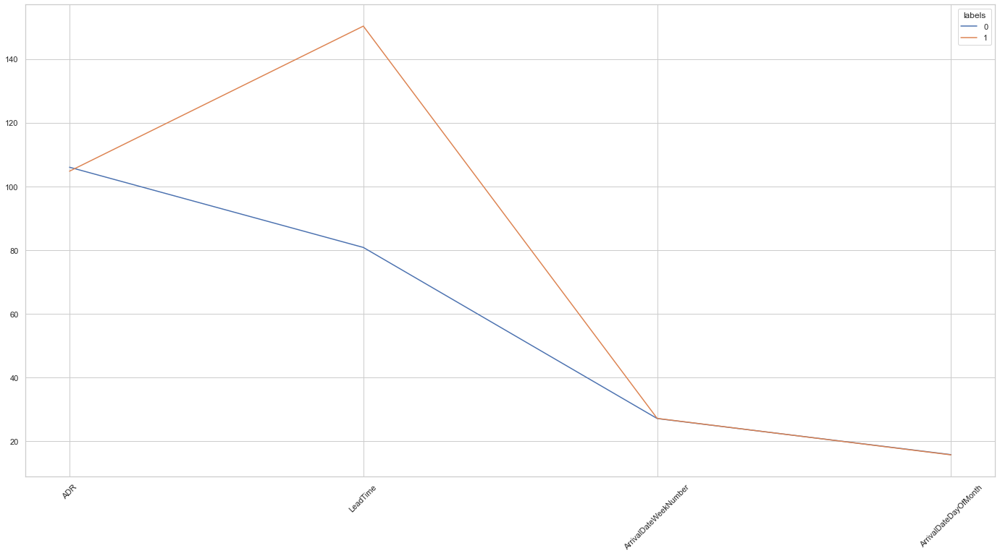

In [45]:
meanplot_df(df[['ADR', 'LeadTime', 'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth']], df['IsCanceled'])

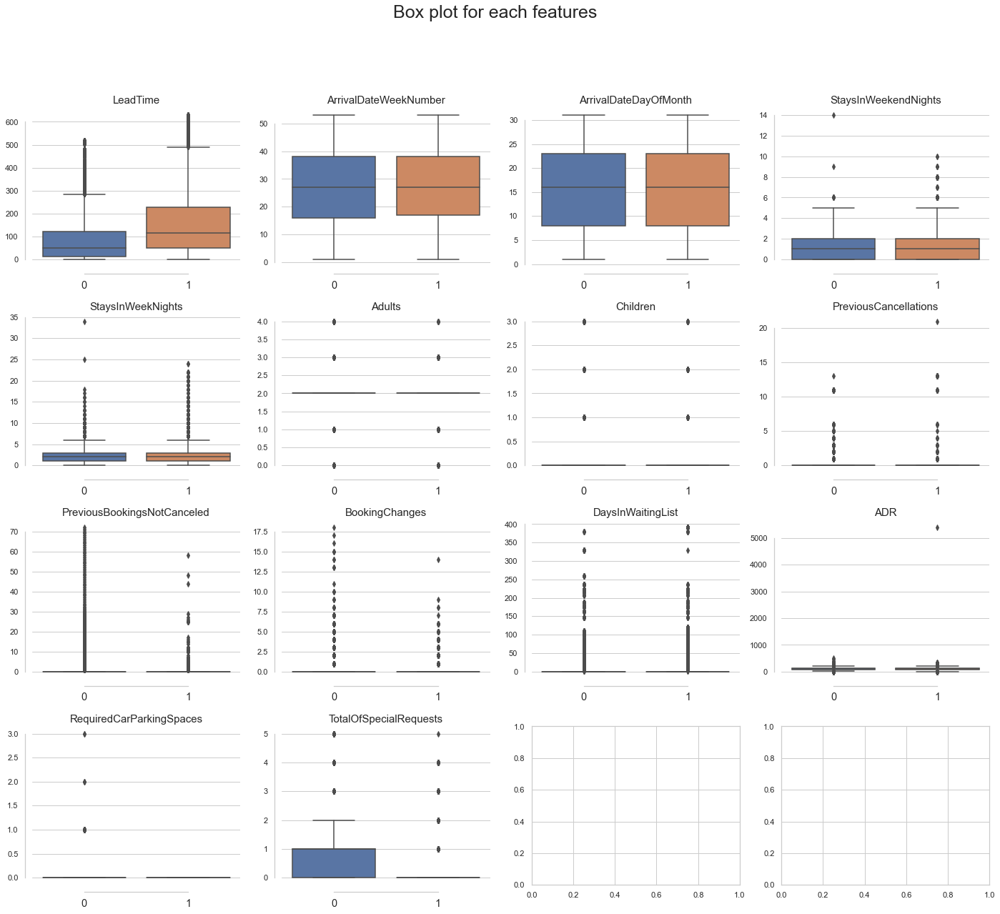

In [46]:
boxplot_withLabels(df[metric_feats],df['IsCanceled'])

<AxesSubplot:xlabel='Meal', ylabel='count'>

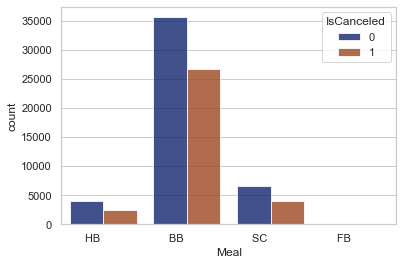

In [47]:
# distribution of age by clusters
sns.countplot(data=df, 
             x="Meal", hue="IsCanceled", alpha =.8,
             palette="dark")

<AxesSubplot:xlabel='ReservedRoomType', ylabel='count'>

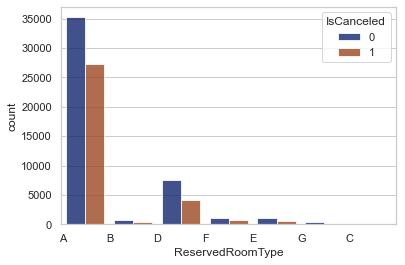

In [48]:
# distribution of age by clusters
sns.countplot(data=df, 
             x="ReservedRoomType", hue="IsCanceled", alpha =.8,
             palette="dark")

<AxesSubplot:xlabel='CustomerType', ylabel='count'>

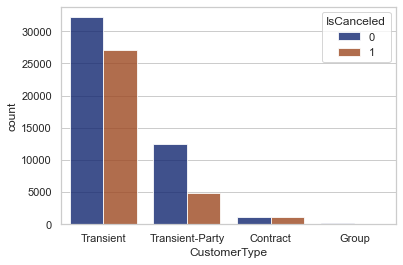

In [49]:
# distribution of age by clusters
sns.countplot(data=df, 
             x="CustomerType", hue="IsCanceled", alpha =.8,
             palette="dark")

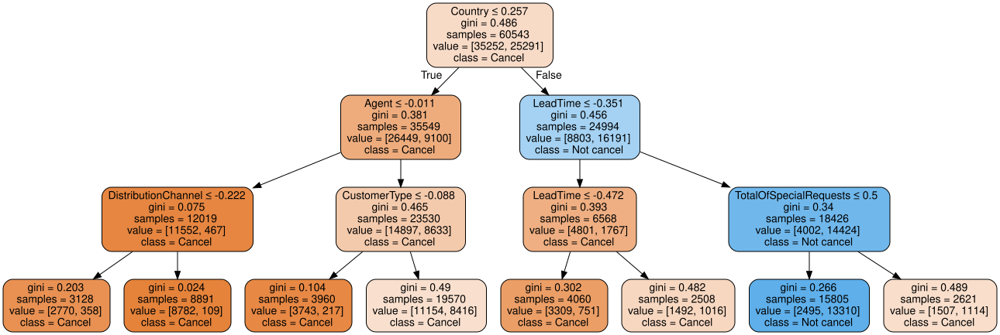

In [50]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(random_state=0, max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

dot_data = export_graphviz(clf, out_file=None, 
                           feature_names=X.columns.to_list(),
                           class_names=["Cancel","Not cancel"],
                           filled=True,
                           rounded=True,
                           special_characters=True)  
# Draw graph
graph = graphviz.Source(dot_data, format="png") 
#graph.render('tree.gv', view=True)  
graph

In [51]:
def _invert(x, limits):
    """inverts a value x on a scale from
    limits[0] to limits[1]"""
    return limits[1] - (x - limits[0])

def _scale_data(data, ranges):
    """scales data[1:] to ranges[0],
    inverts if the scale is reversed"""
    for d, (y1, y2) in zip(data[1:], ranges[1:]):
        assert (y1 <= d <= y2) or (y2 <= d <= y1)
    x1, x2 = ranges[0]
    d = data[0]
    if x1 > x2:
        d = _invert(d, (x1, x2))
        x1, x2 = x2, x1
    sdata = [d]
    for d, (y1, y2) in zip(data[1:], ranges[1:]):
        if y1 > y2:
            d = _invert(d, (y1, y2))
            y1, y2 = y2, y1
        sdata.append((d-y1) / (y2-y1) 
                     * (x2 - x1) + x1)
    return sdata

class ComplexRadar():
    def __init__(self, fig, variables, ranges, n_ordinate_levels=5):
        angles = np.arange(0, 360, 360./len(variables))

        axes = [fig.add_axes([0.1,0.1,0.9,0.9],polar=True,
                label = "axes{}".format(i)) 
                for i in range(len(variables))]
        l, text = axes[0].set_thetagrids(angles, 
                                         labels=variables)
        [txt.set_rotation(angle-90) for txt, angle 
             in zip(text, angles)]
        for ax in axes[1:]:
            ax.patch.set_visible(False)
            ax.grid("off")
            ax.xaxis.set_visible(False)
        for i, ax in enumerate(axes):
            grid = np.linspace(*ranges[i], 
                               num=n_ordinate_levels)
            gridlabel = ["{}".format(round(x)) 
                         for x in grid]
            if ranges[i][0] > ranges[i][1]:
                grid = grid[::-1] # hack to invert grid
                          # gridlabels aren't reversed
            gridlabel[0] = "" # clean up origin
            ax.set_rgrids(grid, labels=gridlabel,
                         angle=angles[i])
            #ax.spines["polar"].set_visible(False)
            ax.set_ylim(*ranges[i])
        # variables for plotting
        self.angle = np.deg2rad(np.r_[angles, angles[0]])
        self.ranges = ranges
        self.ax = axes[0]
    def plot(self, data, *args, **kw):
        sdata = _scale_data(data, self.ranges)
        self.ax.plot(self.angle, np.r_[sdata, sdata[0]], *args, **kw)
    def fill(self, data, *args, **kw):
        sdata = _scale_data(data, self.ranges)
        self.ax.fill(self.angle, np.r_[sdata, sdata[0]], *args, **kw)

UFuncTypeError: ufunc 'multiply' did not contain a loop with signature matching types (dtype('<U32'), dtype('<U32')) -> dtype('<U32')

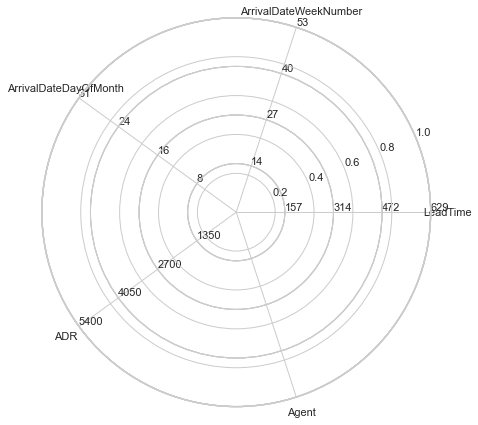

In [52]:
variables = ['LeadTime', 'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth', 'ADR','Agent']
radar_df = df.groupby('IsCanceled')[variables].mean()

data0 = radar_df.iloc[0]
data1 = radar_df.iloc[1]

ranges = [(df[feat].min(), df[feat].max()) for feat in variables]          
# plotting
fig1 = plt.figure(figsize=(6, 8))

radar = ComplexRadar(fig1, variables, ranges)

radar.plot(data0, "-", lw=2, color="b", alpha=0.4, label="Wine Explorer")
radar.plot(data1, "-", lw=2, color="r", alpha=0.4, label="Wine Expert")
radar.plot(data2, "-", lw=2, color="g", alpha=0.4, label="Red Lover")

radar.fill(data0, alpha=0.2)
radar.fill(data1, alpha=0.2)
radar.fill(data2, alpha=0.2)
radar.ax.legend(loc = 'lower right', bbox_to_anchor=(1.1, 0.1))
plt.show()  